---

## 🔍 1. What is Robustness?

### 🧠 **Definition:**

Robustness is the **ability of a machine learning model**—especially in computer vision—to **maintain performance** when it encounters:

* **Noisy data**
* **Unseen distributions**
* **Adversarial inputs**
* **Changes in the environment or domain**

In other words, a robust model performs **reliably and accurately** even when the real-world conditions differ from those during training.

---

### 📷 **In Computer Vision Context:**

Imagine a model trained to recognize student bedrooms using curated training images. But in deployment, it receives images with:

* Unusual lighting
* Different room styles
* Cultural differences

If it **still performs well**, it is **robust**.

From the PDF:

> What Google thinks are student bedrooms
> → Training Data vs. Test Data (Slide 2)

This highlights the **domain gap**—a central concern for robustness.

---

### 🧪 **Why is Robustness Important?**

1. **Real-World Deployment:**
   Models are trained in controlled, clean datasets but deployed in messy, unpredictable environments.

2. **Safety-Critical Systems:**
   Autonomous vehicles, medical imaging, and security systems need **fail-safe behavior** under unexpected inputs.

3. **Fairness & Ethics:**
   Robust models are less likely to propagate bias or make unfair decisions across demographic groups.

4. **Trustworthiness:**
   If a model fails drastically under slight variations, users and stakeholders lose trust.

---

### 🔁 **Robustness vs Generalization (Subtle Distinction):**

| Term               | Focus                                                                             |
| ------------------ | --------------------------------------------------------------------------------- |
| **Generalization** | How well the model performs on **unseen but similar** data (same distribution)    |
| **Robustness**     | How well the model performs on **unseen and *different*** data (new distribution) |

> Slide 6–9 in the PDF:
> Highlights that `P_train ≠ P_test` is common, and **robust models** are expected to handle this gracefully.

---

### 📉 **What Reduces Robustness?**

* **Overfitting to training data**
* **Biased training sets**
* **Poor labeling quality**
* **Lack of data diversity**
* **High model sensitivity to noise**

---

### 🧱 **How to Build Robust Models?**

(We’ll go deeper in later sections, but here’s the preview)

* Use **data augmentation** to simulate diversity
* **Reduce model complexity** to avoid overfitting
* Collect **better, more representative data**
* Use **adversarial training** to improve noise resistance
* Evaluate on **out-of-distribution** test sets

---

### ✅ Summary Cheat Sheet

| Aspect              | Explanation                                                  |
| ------------------- | ------------------------------------------------------------ |
| **Definition**      | Consistent performance despite changes or noise              |
| **Key Challenge**   | Domain shift or test conditions differing from training      |
| **Real-World Need** | Safety, fairness, trust, general applicability               |
| **Reduced By**      | Biases, narrow data, poor generalization, adversarial inputs |
| **Improved With**   | Data augmentation, good labeling, diverse sampling, testing  |

---



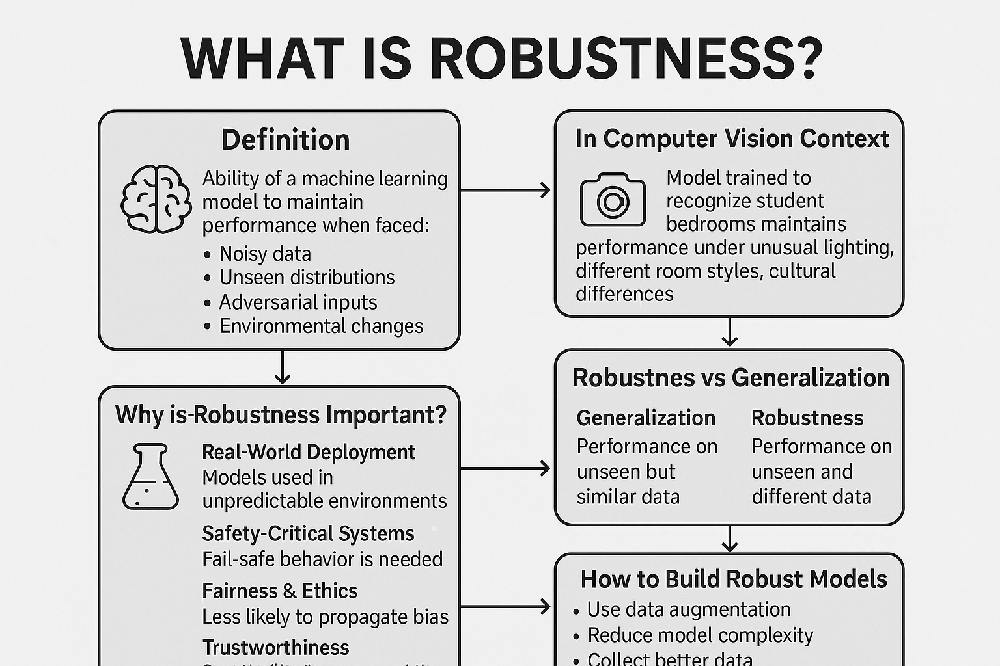


---

## 🧠 2. Generalization & Domain Gap

---

### 🔁 **A. What is Generalization?**

**Definition:**
Generalization is a model’s ability to perform well on **unseen examples** that come from the **same distribution** as the training data.

**In theory**, we assume that:

* Training data: $(x_{\text{train}}, y_{\text{train}}) \sim p_{\text{data}}$
* Test data: $(x_{\text{test}}, y_{\text{test}}) \sim p_{\text{data}}$

In this **ideal i.i.d. (independent and identically distributed)** scenario:

* The test data is just another sample from the same process as the training data.
* Performance drop is minimal.

**BUT in practice... this is rarely true.**

---

### 🌍 **B. What is the Domain Gap?**

**Definition:**
The **domain gap** (or distribution shift) is the **difference** between the **training distribution $p_{\text{train}}$** and the **testing or deployment distribution $p_{\text{test}}$**.

**Formal notation:**

* $p_{\text{train}}(x, y) \neq p_{\text{test}}(x, y)$

This causes:

* **Prediction errors**
* **Poor generalization**
* **Unexpected model behavior**

---

### 📉 **C. Where Does the Domain Gap Come From?**

#### 1. **Different Environments:**

* Training in simulation (e.g., GTA), testing in real-world driving.

#### 2. **Cultural/Geographic Shifts:**

* Training on western bedroom images, testing on Asian-style interiors.

#### 3. **Temporal Drift:**

* Trained on 2018 data; tested on 2025 data where patterns have evolved.

#### 4. **Sensor Shift / Quality:**

* Training with DSLR images; testing on smartphone photos.

#### 5. **Labeling Differences or Errors:**

* Mislabeling or missing classes can make real-world deployment unpredictable.

---

### ⚠️ **D. Consequences of Domain Gap**

1. **Generalization Error Increases**

   > The model cannot extrapolate beyond what it saw.

2. **Misclassifications & Bias Amplification**

   > Underrepresented groups or styles are more prone to error.

3. **Lack of Trust & Safety**

   > Especially dangerous in mission-critical systems (e.g., autonomous cars).

From the PDF (Slides 8–10):

> "This is a huge assumption! Almost never true in practice! P(train) ≠ P(test)"

---

### 📊 **E. Examples from the Slides**

#### **Example 1:**

* Driving simulator (GTA) vs real world → domain gap in perception and dynamics

#### **Example 2:**

* Space of natural images: model trained only on a small biased region of that space → poor performance on unseen image types.

#### Visual:

* Training domain and testing domain are shown as **non-overlapping subsets** of image space (Slide 24).

---

### 📌 **F. Why Is This Relevant to Robustness?**

* Robust models are expected to **handle the domain gap gracefully**.
* Generalization fails when the **gap is large**, but robustness techniques try to **bridge this gap**.
* Poor robustness → high generalization error → unreliable AI

---

### ✅ Summary Table

| Concept              | Definition                                                               |
| -------------------- | ------------------------------------------------------------------------ |
| Generalization       | Performance on **new data** from the **same distribution**               |
| Domain Gap           | Mismatch between **train** and **test** data distributions               |
| Result of Domain Gap | High generalization error, poor real-world performance                   |
| Robustness link      | A robust model performs well **even when the domain gap is significant** |

---



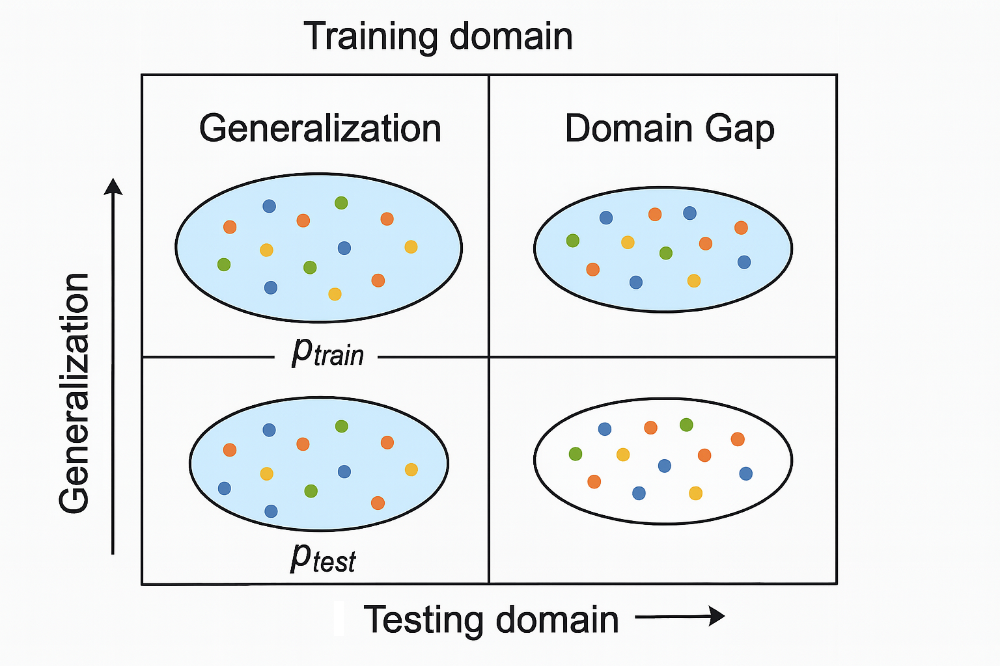

---

## ⚠️ Topic 3: Consequences of Poor Robustness (Bias, Fairness, Trust)

---

### 🧨 A. What Happens When Robustness Fails?

When models lack robustness, they often:

* Fail **outside of the training distribution**
* Perform **inconsistently across demographic groups**
* Suffer from **algorithmic bias**
* Cause **harm in real-world applications**

From the PDF (Slides 25–27):

> "Our datasets are often poorly labeled and biased... models perform well on lab data but generalize poorly to real-world scenarios."

---

## 📊 B. Bias in Data and Algorithms

### 1. **What is Algorithmic Bias?**

Bias occurs when an ML system **systematically discriminates** against certain groups, categories, or conditions due to skewed data or flawed assumptions.

#### Example (PDF Slide 26):

> **Gender Shades Study** ([Buolamwini et al., 2018](http://proceedings.mlr.press/v81/buolamwini18a/buolamwini18a.pdf))
> Facial recognition models had:

* \~99% accuracy for **white men**
* <70% accuracy for **dark-skinned women**

Why?

* Models were trained on datasets **overrepresenting** light-skinned, male faces.

### 2. **Sources of Bias:**

* Imbalanced datasets
* Poor labeling quality
* Stereotypical data generation
* Sampling only from certain cultures, ages, or settings

---

## 👩🏽‍⚖️ C. Fairness Issues

### 1. **Fairness ≠ Equal Accuracy**

We often see **performance gaps** across:

* Gender
* Race
* Age
* Geography
* Language

If the model is robust, these gaps should be minimized.

### 2. **Social Harm Examples:**

* Misclassification of minority faces → wrongful arrests
* Unfair lending models → discriminatory loan approvals
* Inappropriate content moderation filters

### 3. **Unethical or Questionable Datasets**

From the PDF (Slide 27):

> Stanford study predicting **sexual orientation** from face images—criticized for:

* Ethical concerns
* Misuse of sensitive data
* Exaggerated claims

---

## 🧑🏿‍🤝‍🧑🏻 D. Human Labelers and Bias

### 1. **Annotation Inconsistency**

Even simple tasks show **human inconsistency** and **bias** (Slides 18–20).

> Example: Asking 850 Turkers to pick a number 1–10 → uneven, non-uniform distribution.

### 2. **Biased or Lazy Labeling**

* Raters may rush
* Bring cultural assumptions
* Lack context

### 3. **Loop Problem**

If humans are biased, and they train the model, and the model is used to assist labeling… → feedback loop of **compounded bias**

---

## 🏥 E. Trust and Safety

### 1. **Loss of Trust**

* Users notice when models are unfair
* Stakeholders distrust AI if results are not interpretable or reliable
* Public backlash possible (e.g., media coverage, lawsuits)

### 2. **Safety-Critical Failures**

* Self-driving cars misidentifying pedestrians
* Medical imaging systems failing on non-Caucasian skin
* Content moderation flagging harmless posts from underrepresented groups

---

## ✅ Summary Table

| Consequence            | Description                                                                |
| ---------------------- | -------------------------------------------------------------------------- |
| **Bias**               | Systematic error favoring certain groups due to skewed data                |
| **Fairness Issues**    | Unequal performance across demographics                                    |
| **Loss of Trust**      | Users and society lose confidence in model predictions                     |
| **Ethical Violations** | Use of questionable data, lack of transparency, surveillance, misuse       |
| **Safety Failures**    | Dangerous outcomes in critical domains (e.g., vehicles, medicine, justice) |

---


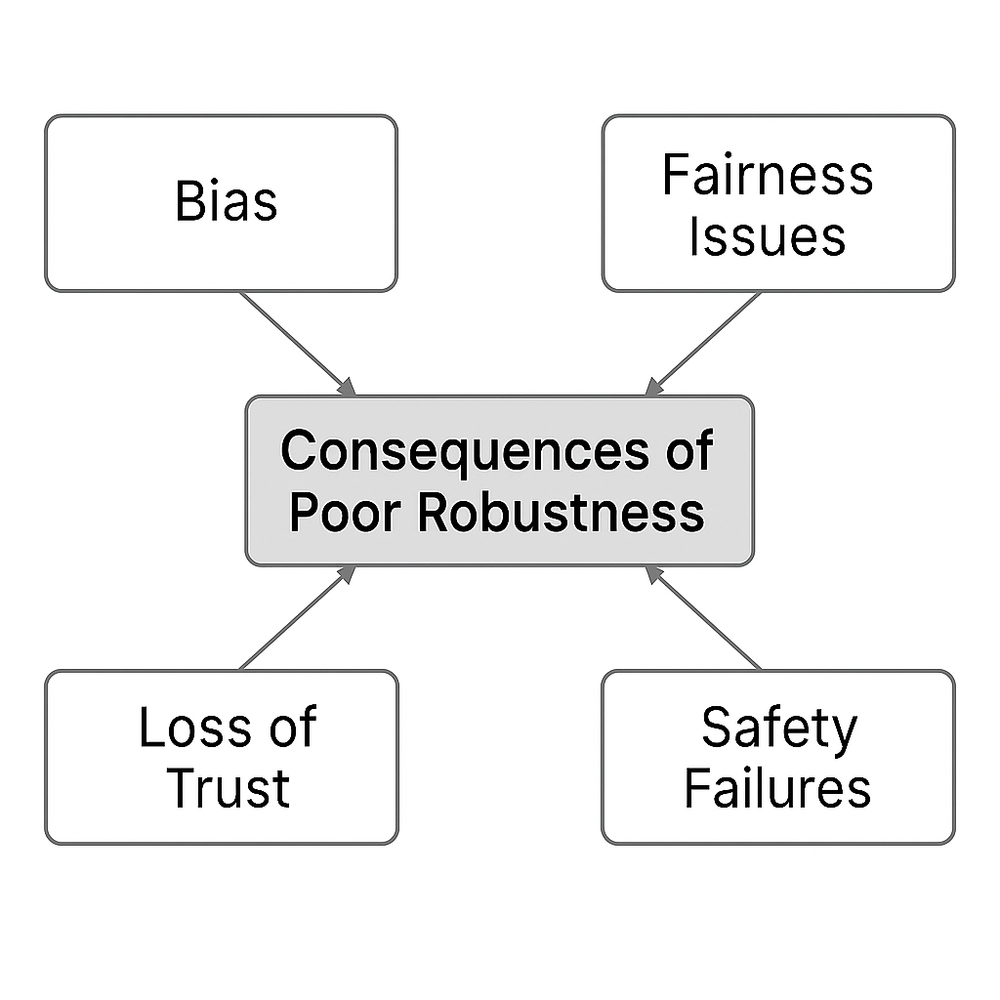


---

## 🧩 Topic 4: Data Collection and Human Annotation Issues

Robustness begins with **data**. If the data used for training is biased, mislabeled, or unrepresentative, the model will inherit these flaws.

---

### 📦 A. What Makes “Good” Data?

From the PDF (Slide 28):

> A high-quality dataset must be:

* ✅ **Correctly labeled**
* ✅ **Unbiased**
* ✅ **Representative** of all relevant variations (e.g., lighting, angles, demographics)

---

### 👁️ B. Human-in-the-Loop Annotation

#### 1. **Why Use Humans?**

Some tasks (e.g., labeling “dog vs wolf” or “smile vs smirk”) require subjective judgment or real-world context.

#### 2. **Annotation Modes (Slide 33):**

| Mode                      | Example                               |
| ------------------------- | ------------------------------------- |
| **For fun**               | Games with a purpose (e.g., ESP game) |
| **For money**             | Amazon Mechanical Turk (MTurk)        |
| **For research**          | Visipedia, ImageNet                   |
| **To prove you're human** | Captchas                              |

Each has its own **incentives** and **drawbacks**.

---

### 🤨 C. Problems with Human Annotation

#### 1. **Bias and Subjectivity**

From Slide 34–36 (Experiments by Greg Little):

> Turkers were asked to pick a random number from 1–10. Results were **not uniformly distributed** → **humans are biased**, even in trivial tasks.

#### 2. **Inconsistency Across Annotators**

From Slide 20:

> In a test with 100 Human Intelligence Tasks (HITs):

* One option was chosen **96% of the time**
* The other two barely at all
  This suggests **strong labeling skew**, not reliable randomness.

#### 3. **Motivation Issues**

* Low pay = low effort
* Boredom, fatigue, or confusion can cause poor performance

#### 4. **Feedback Loops**

If a biased model is used to label data (semi-supervised learning), future data becomes even more skewed.

---

### 🌎 D. Cultural and Demographic Gaps

* Annotators come from specific regions/cultures (e.g., majority of MTurkers are US-based)
* May **misunderstand cultural context** or **visual cues**

  * Example: Different norms of facial expressions, architecture, clothing

---

### 🧪 E. Practical Risks in CV Applications

| Task                   | Risk from Bad Annotation                           |
| ---------------------- | -------------------------------------------------- |
| **Object detection**   | Missing or wrong labels lead to unsafe models      |
| **Medical imaging**    | Incorrectly labeled tumors = fatal outcomes        |
| **Facial recognition** | Misidentifying individuals → privacy violations    |
| **Action recognition** | Poor granularity in labeling → weak generalization |

---

### 🛠️ F. Strategies to Improve Data Quality

1. **Multiple Annotators per Sample**

   * Use majority vote or confidence scoring

2. **Gold-Standard Checks**

   * Inject known answers to monitor annotator reliability

3. **Training Annotators**

   * Provide clear instructions and examples

4. **Consensus Algorithms**

   * Model agreement and uncertainty across human labels

5. **Active Learning**

   * Prioritize labeling of samples the model is most uncertain about

---

### ✅ Summary Table

| Problem        | Consequence                 | Solution                                |
| -------------- | --------------------------- | --------------------------------------- |
| Human bias     | Labeling skew               | Demographic diversity, gold labels      |
| Inconsistency  | Unreliable training targets | Redundant labeling, agreement scoring   |
| Low motivation | Poor quality annotations    | Pay fairly, use gamification            |
| Cultural gaps  | Misinterpreted content      | Global annotation pools, reviewer stage |
| Feedback loops | Compounding errors in model | Human verification, data audits         |

---


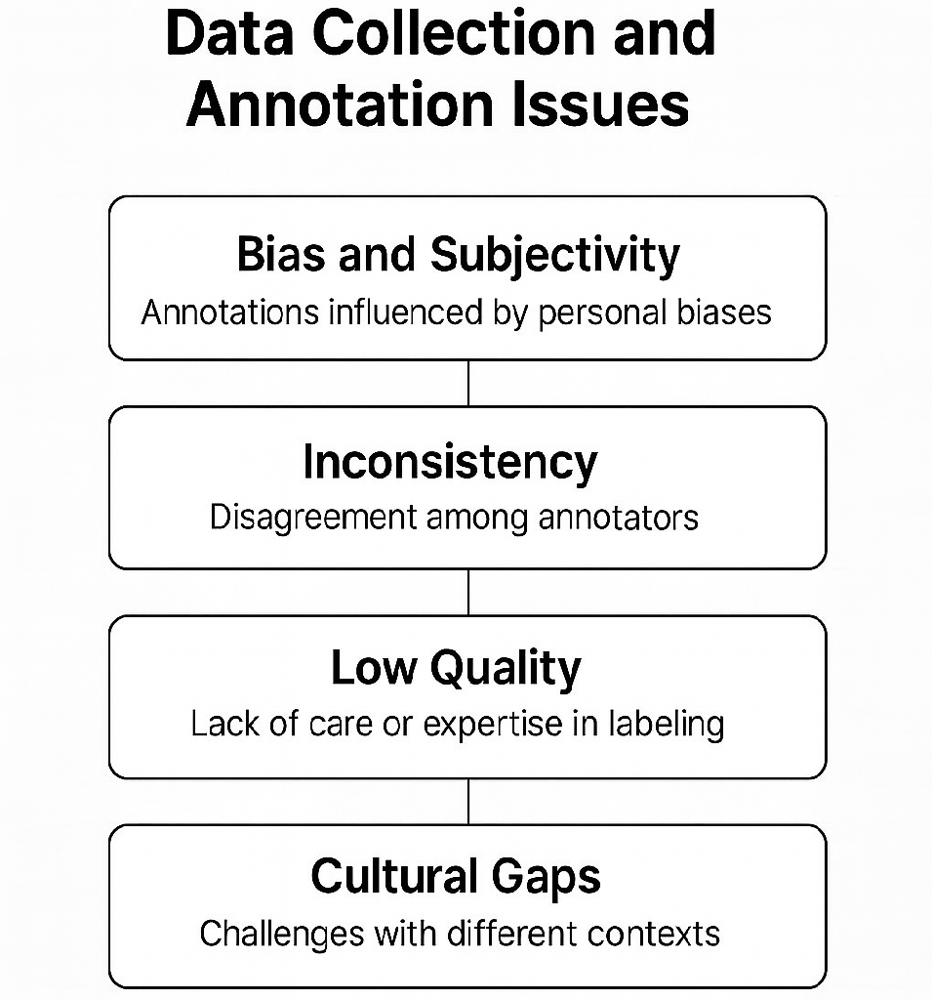


---

## 🔁 Topic 5: Domain Adaptation and Data Augmentation

---

### 🧭 A. Domain Adaptation

#### 1. **Definition:**

Domain adaptation refers to techniques that enable a model trained on a **source domain** (e.g., synthetic or curated data) to perform well on a **target domain** (e.g., real-world data) where the data distributions differ:

$$
P_{\text{train}}(x, y) \ne P_{\text{test}}(x, y)
$$

#### 2. **Why It’s Needed:**

> From the PDF (Slide 43):
> *"Domain gap between pₜᵣₐᵢₙ and pₜₑₛₜ will cause us to fail to generalize."*

Examples:

* Training on **GTA driving data**, testing on **real-world traffic**
* Training on **webcam images**, deploying on **smartphone cameras**

#### 3. **Types of Domain Adaptation:**

| Type                | Description                                                  |
| ------------------- | ------------------------------------------------------------ |
| **Unsupervised**    | No labels in the target domain                               |
| **Supervised**      | Some labeled data available in the target domain             |
| **Semi-supervised** | A few labeled + many unlabeled examples in the target domain |
| **Multi-source**    | Train on several domains and generalize to a new one         |

#### 4. **Common Methods:**

* **Domain adversarial training** (e.g., DANN)
* **Feature alignment** (align source/target distributions in latent space)
* **Style transfer** (make source look like target or vice versa)

---

### 🧪 B. Data Augmentation

#### 1. **Definition:**

Data augmentation is the process of **increasing training data diversity** by applying **label-preserving transformations** to existing data.

From the PDF (Slide 58):

> Shows “Fish” class being augmented through cropping, mirroring, darkening, etc.

#### 2. **Goals:**

* Mimic real-world variability
* Reduce overfitting
* Improve robustness to noise, occlusion, viewpoint, lighting, etc.

#### 3. **Common Techniques:**

| Technique          | Example                                           |
| ------------------ | ------------------------------------------------- |
| **Geometric**      | Rotation, flipping, scaling, cropping             |
| **Photometric**    | Brightness, contrast, blur, hue, noise            |
| **Mixing**         | MixUp, CutMix (blending multiple images together) |
| **Style Transfer** | Re-rendering images in different visual styles    |
| **Random Erasing** | Random patches are blacked out or removed         |

#### 4. **Why It Works:**

* Encourages the model to learn **invariant features**
* Helps simulate **out-of-distribution** scenarios

---

### ⚖️ C. Comparison: Domain Adaptation vs Data Augmentation

| Aspect               | Domain Adaptation                        | Data Augmentation                         |
| -------------------- | ---------------------------------------- | ----------------------------------------- |
| Target               | Adapts to a **new distribution**         | Expands existing training distribution    |
| Requires Target Data | ✅ Yes (may be labeled/unlabeled)         | ❌ No                                      |
| Goal                 | Improve transferability                  | Improve generalization                    |
| Use Case             | Source ≠ target (e.g., synthetic → real) | Small dataset or prevent overfitting      |
| Example              | GTA images → real-world driving images   | Rotate, flip, darken existing fish images |

---

### ✅ Summary Cheat Sheet

| Technique         | Purpose                                  | Example Use Case                                |
| ----------------- | ---------------------------------------- | ----------------------------------------------- |
| Domain Adaptation | Transfer model to new domain             | Sim to real-world driving                       |
| Data Augmentation | Expand training variety + reduce overfit | Rotate/blur/crop images in small image datasets |

---


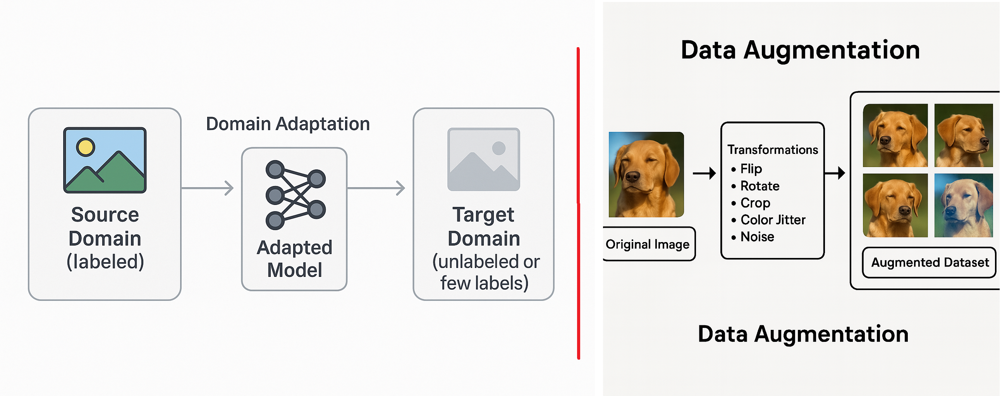

---

## 🚨 Topic 6: Adversarial Examples and Model Vulnerabilities

---

### 1. What Are Adversarial Examples?

* **Definition**
  Small, often imperceptible perturbations $r$ added to a valid input $x$ that cause a model $f$ to make an incorrect, high-confidence prediction:

  $$
    f(x + r) \;\neq\; f(x), 
    \quad \|r\| \text{ small}
  $$
* **Key Insight**
  Neural networks operate in **high-dimensional spaces**, where decision boundaries can be extremely close to data points; tiny shifts can cross a boundary.

---

### 2. Classic Demonstrations

1. **“Easily Fooled” (Nguyen et al., CVPR 2015)**

   * Generated images that look like random noise to humans but are classified with >99% confidence as familiar objects (e.g., “school bus”).
   * Illustrates **blind spots** in the learned feature space.

2. **FGSM: Fast Gradient Sign Method (Goodfellow et al., 2014)**

   * Perturbation computed in one step using the model’s gradients:

     $$
       r = \epsilon \, \mathrm{sign}(\nabla_x \, \mathcal{L}(f(x), y))
     $$
   * Shows how gradient information can be exploited to maximize loss.

3. **Physical-World Attacks**

   * **3D-printed turtle** misclassified as a “rifle” from multiple viewpoints (Athalye et al., 2017).
   * Demonstrates that adversarial examples can transfer **beyond pixels** into real objects.

---

### 3. Taxonomy of Attacks

| Attack Type    | Access         | Method                                            |
| -------------- | -------------- | ------------------------------------------------- |
| **White-box**  | Full model     | Use gradients to craft $r$ (FGSM, PGD, CW)        |
| **Black-box**  | No internal    | Query model to estimate gradients or use transfer |
| **Targeted**   | Specific label | Force $f(x + r) = t$ for chosen target $t$        |
| **Untargeted** | Any wrong      | Just push prediction away from true label         |

---

### 4. Why Models Are Vulnerable

* **High Dimensionality**
  Small manipulations can traverse a large portion of the space.
* **Linear Behavior in Activations**
  Local linearity makes simple gradient methods effective.
* **Overconfidence Outside Training Data**
  No mechanism to recognize “unknown” regions—model extrapolates with high confidence.

---

### 5. Consequences of Adversarial Vulnerabilities

* **Security**
  Attackers can trick facial recognition, spam filters, or autonomous vehicles.
* **Safety**
  Misclassification of traffic signs or pedestrians can cause accidents.
* **Trust**
  Undermines user confidence in AI systems that should be reliable.

---

### 6. Defenses and Robustification

| Defense                  | Idea                                                           | Trade-off                         |
| ------------------------ | -------------------------------------------------------------- | --------------------------------- |
| **Adversarial Training** | Include adversarial examples in training set                   | Computationally expensive         |
| **Gradient Masking**     | Obfuscate or remove useful gradient information                | Often bypassed by smarter attacks |
| **Certified Defenses**   | Provide provable bounds on robustness around each sample       | Limited to small models/datasets  |
| **Input Preprocessing**  | Denoising, JPEG compression, or random resizing                | Can hurt clean accuracy           |
| **Ensemble Models**      | Aggregate predictions from multiple differently trained models | Higher inference cost             |

---


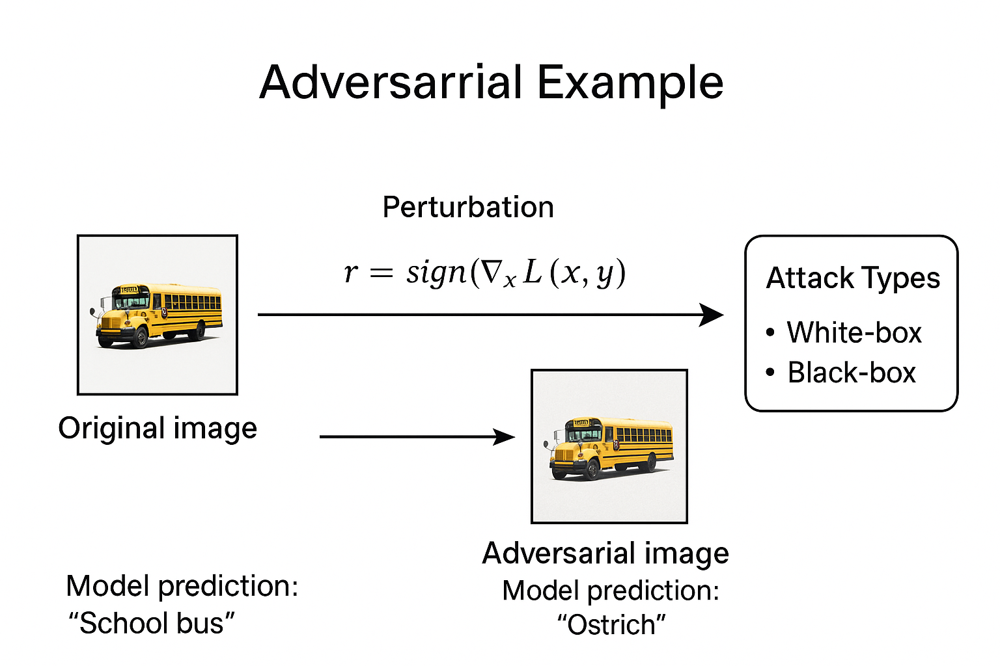

---

## 🔍 Topic 7: Evaluating and Certifying Robustness

To ensure a model is truly robust—and not just tuned to a few attacks or corruptions—we need **systematic evaluation** and, where possible, **formal certification** of its performance under worst-case scenarios.

---

### 1. Defining the Threat Model

Before any evaluation, clearly specify:

* **Adversary’s goal:**
  – *Targeted* (force a specific wrong label) vs *untargeted* (any wrong label).
* **Adversary’s knowledge:**
  – *White-box* (full access to model, gradients) vs *black-box* (query only).
* **Perturbation budget:**
  – Maximum allowable distortion, e.g. ‖r‖∞ ≤ ε for pixel attacks or ‖r‖2 ≤ ε in ‖·‖2 norm.
* **Input constraints:**
  – Pixel value bounds (\[0,255]), spatial constraints (e.g. patch attacks).

A well-defined threat model ensures **reproducibility** and **fair comparison**.

---

### 2. Empirical Robustness Evaluation

#### A. **Adversarial Attacks**

1. **Gradient-based attacks:**

   * **FGSM** (one‐step)
   * **PGD** (iterative projected gradient descent)
   * **C\&W** (optimization‐based)

2. **Black-box attacks:**

   * **Boundary attack**
   * **Transfer attacks** (craft on surrogate model)

3. **Evaluation Metric:**

   * **Robust accuracy**: % of test samples for which the model’s prediction remains correct under the strongest attack within the budget.
   * **Attack success rate**: % of samples misclassified by the attack.

Use strong, adaptive attacks (e.g., **AutoAttack** ensemble) to avoid “gradient masking” illusions.

#### B. **Corruption and Perturbation Benchmarks**

1. **ImageNet-C / CIFAR-10-C** (Hendrycks & Dietterich 2019)

   * 15 common corruptions (e.g., Gaussian noise, blur, JPEG compression) at 5 severity levels.
   * **Corruption Error (CE):** Normalized error across corruptions.

2. **ImageNet-P / CIFAR-10-P**

   * Tests model’s **prediction stability** under small, sequential perturbations (e.g. shifts, brightness changes).
   * **Flip rate**: how often the model’s top‐1 prediction changes.

3. **Common Metrics:**

   * **mCE**: mean CE over all corruptions.
   * **mFR**: mean flip rate.

---

### 3. Calibration & Confidence Reliability

* **Motivation:** A robust model shouldn’t be overconfident on adversarial or corrupted inputs.
* **Tools:**

  * **Reliability diagram**: plots accuracy vs predicted confidence.
  * **Expected Calibration Error (ECE)**.
* **Goal:** low ECE even under shifts.

---

### 4. Formal Certification Methods

Unlike empirical tests, **certified defenses** provide provable guarantees:

> “For any perturbation with ‖r‖ ≤ ε, the model’s prediction will not change.”

#### A. **Randomized Smoothing**

* Add Gaussian noise to input at inference, and use majority vote over many samples.
* Certify an ℓ₂‐ball radius around each input.
* **Pros:** Scales to ImageNet, ℓ₂ guarantees.
* **Cons:** Only ℓ₂ norm, requires thousands of forward passes.

#### B. **Lipschitz and Spectral Bounds**

* Constrain network’s Lipschitz constant (e.g. via spectral normalization).
* Provides worst‐case output deviation given input perturbation.
* **Pros:** Continuous guarantee; **Cons:** Loose bounds, limited scalability.

#### C. **Interval Bound Propagation (IBP)** / **Abstract Interpretation**

* Propagate input intervals through each layer to bound output logits.
* **Pros:** Exact for small networks; **Cons:** Overly conservative bounds for deep nets.

#### D. **Convex Relaxation**

* Relax activation constraints to a convex set (e.g., zonotopes).
* Solve a convex optimization per input to certify robustness.
* **Pros:** Tighter bounds; **Cons:** Computationally heavy.

---

### 5. Standardized Robustness Leaderboards & Tools

* **RobustBench**: Benchmarks hundreds of models on ImageNet ℓ₂/ℓ∞ threats, with both empirical and certified scores.
* **CleverHans** / **Foolbox**: Libraries for attack and defense implementations.
* **OpenAttack**: Modular attack evaluation framework.

Use these to **compare** against published baselines and ensure code transparency.

---

### 6. Reporting Best Practices

1. **Specify threat model** (norm, ε, white/black-box).
2. **Use strong, adaptive attacks** for empirical tests (e.g., PGD‐100, AutoAttack).
3. **Report both clean & robust accuracies**.
4. **Include calibration metrics** (ECE under attack/corruption).
5. **Share code & pretrained models** for reproducibility.
6. **If claiming certification**, detail the method, bounds, and computational cost.

---

### 📌 Exam Cheat Sheet

| Aspect                  | Key Point                                                       |
| ----------------------- | --------------------------------------------------------------- |
| Threat model            | Norm (ℓ₂ vs ℓ∞), ε, adversary knowledge                         |
| Empirical eval          | Robust accuracy under PGD/AutoAttack, corruption mCE, flip rate |
| Calibration             | Reliability diagrams, ECE under shift                           |
| Certification           | Randomized smoothing, IBP, Lipschitz bounds                     |
| Tools & Reproducibility | RobustBench, Foolbox, open code                                 |

---


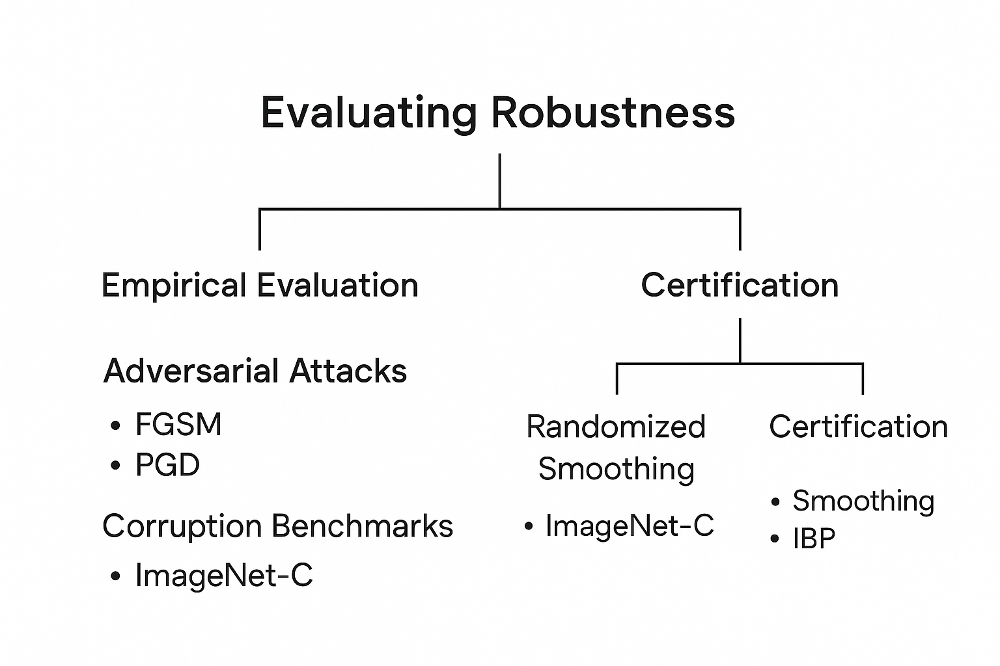

---

## 🧠 Topic 8: Strategies for Building Robust Models

Building robust models means designing systems that **perform reliably under distributional shifts, adversarial conditions, and noisy data**. Here are the core strategies:

---

### 1. **Adversarial Training**

* **Definition**: Train the model using adversarial examples crafted during training (e.g., using FGSM, PGD).
* **Effect**: Increases resistance to perturbations, but may reduce clean accuracy if not balanced properly.
* **Variants**:

  * FGSM-based adversarial training
  * Projected Gradient Descent (PGD)
  * TRADES (tradeoff between clean and robust accuracy)

---

### 2. **Data Augmentation**

* **Purpose**: Increase data diversity by simulating real-world variations.
* **Examples**:

  * Image: rotations, color jitter, Gaussian noise
  * Text: back-translation, synonym replacement
  * Audio: pitch shift, time-stretch
* **Advanced**: MixUp, CutMix, AugMix

---

### 3. **Regularization Techniques**

* **Goal**: Prevent overfitting to training data and improve generalization.
* **Examples**:

  * **Dropout**: Randomly turn off neurons during training.
  * **Weight decay**: Penalizes large weights (L2 norm).
  * **Label smoothing**: Encourages less confident predictions.

---

### 4. **Ensemble Methods**

* **Concept**: Combine multiple models to reduce variance and boost robustness.
* **Types**:

  * Bagging (e.g., Random Forest)
  * Boosting (e.g., XGBoost)
  * Deep ensembles (independent neural networks with different initializations)

---

### 5. **Robust Loss Functions**

* **Motivation**: Make the model less sensitive to outliers or mislabels.
* **Examples**:

  * Huber loss
  * MAE instead of MSE
  * Margin-based losses

---

### 6. **Certified Defenses**

* **Definition**: Formal guarantees that a model is robust within a perturbation radius.
* **Examples**:

  * Randomized smoothing
  * Interval bound propagation
* **Trade-off**: Often less performant in practice but provide theoretical robustness.

---

### 7. **Out-of-Distribution (OOD) Detection**

* **Why?**: Robustness also means rejecting or flagging unknown data.
* **Techniques**:

  * Maximum softmax probability (MSP)
  * Mahalanobis distance-based scoring
  * Energy-based OOD detection

---

### 8. **Training with Noisy Labels**

* **Strategy**: Use methods to reduce the impact of incorrect labels in the training set.
* **Examples**:

  * Co-teaching: train two models and only use clean labels agreed upon by both.
  * Self-training with confidence thresholds.

---

### 9. **Robust Architectures**

* Use architectures that are inherently more stable or interpretable, e.g.:

  * ResNets over plain CNNs
  * Vision Transformers with attention smoothing
  * Sparse and low-rank models for better generalization

---


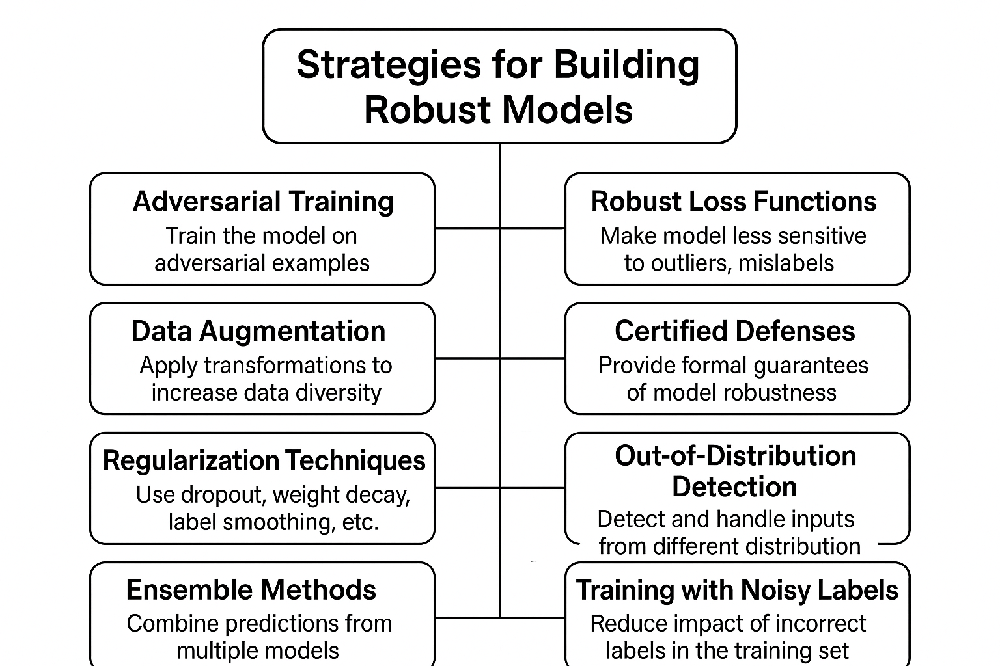